<a href="https://colab.research.google.com/github/diegarza/Regresion_Lineal/blob/main/Actividad4_A01705984.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [432]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [433]:
df = pd.read_csv('DF_Mexico.csv')

#**Nulos y outliers**

In [434]:
# Convertir a float
df[['host_response_rate','host_acceptance_rate']]

,host_response_rate,host_acceptance_rate
0,100%,NaN
1,NaN,NaN
2,100%,90%
3,NaN,NaN
4,100%,86%
...,...,...
24219,100%,100%
24220,NaN,NaN
24221,NaN,96%
24222,100%,100%


In [435]:
df['host_response_rate']= df['host_response_rate'].str.rstrip('%').astype(float)

In [436]:
df['host_acceptance_rate']= df['host_acceptance_rate'].str.rstrip('%').astype(float)

In [437]:
df['price']= df['price'].str.replace('$', '').str.replace(',', '').astype(float)

<ipython-input-437-b8aa054d9371>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['price']= df['price'].str.replace('$', '').str.replace(',', '').astype(float)


In [438]:
df[['host_response_rate','host_acceptance_rate']]

,host_response_rate,host_acceptance_rate
0,100.0,NaN
1,NaN,NaN
2,100.0,90.0
3,NaN,NaN
4,100.0,86.0
...,...,...
24219,100.0,100.0
24220,NaN,NaN
24221,NaN,96.0
24222,100.0,100.0


In [439]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24224 entries, 0 to 24223
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            24224 non-null  int64  
 1   listing_url                                   24224 non-null  object 
 2   scrape_id                                     24224 non-null  int64  
 3   last_scraped                                  24224 non-null  object 
 4   source                                        24224 non-null  object 
 5   name                                          24223 non-null  object 
 6   description                                   23296 non-null  object 
 7   neighborhood_overview                         15145 non-null  object 
 8   picture_url                                   24224 non-null  object 
 9   host_id                                       24224 non-null 

In [440]:
df_tipocuarto = df['room_type']

In [441]:
columnas = ['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'license', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month']

for columna in df[columnas]:
  if df[columna].isnull().sum() == 24224:
    df = df.drop(columna, axis = 1)
  elif df[columna].isnull().sum() != 24224:
    if df[columna].dtypes == 'object':
      df[columna] = df[columna].fillna('S/D')
    elif df[columna].dtypes == 'float64':
      df[columna] = df[columna].fillna(df[columna].mean())
    else:
      df[columna] = df[columna].fillna(method="ffill")
      df[columna] = df[columna].fillna(method="bfill")
  elif df[columna].isnull().sum() == 0:
    df[columna] = columna

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24224 entries, 0 to 24223
Data columns (total 71 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            24224 non-null  int64  
 1   listing_url                                   24224 non-null  object 
 2   scrape_id                                     24224 non-null  int64  
 3   last_scraped                                  24224 non-null  object 
 4   source                                        24224 non-null  object 
 5   name                                          24224 non-null  object 
 6   description                                   24224 non-null  object 
 7   neighborhood_overview                         24224 non-null  object 
 8   picture_url                                   24224 non-null  object 
 9   host_id                                       24224 non-null 

In [442]:
columnas_no_eliminar = ['host_acceptance_rate', 'host_response_rate', 'review_scores_location',
                        'review_scores_cleanliness', 'price', 'availability_365', 'number_of_reviews',
                        'reviews_per_month', 'review_scores_communication']

columnas = ['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type',
       'room_type', 'accommodates', 'bathrooms_text', 'bedrooms', 'beds',
       'amenities', 'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month']

df = df.drop(columns = [i for i in columnas if i not in columnas_no_eliminar])

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24224 entries, 0 to 24223
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   host_response_rate           24224 non-null  float64
 1   host_acceptance_rate         24224 non-null  float64
 2   price                        24224 non-null  float64
 3   availability_365             24224 non-null  int64  
 4   number_of_reviews            24224 non-null  int64  
 5   review_scores_cleanliness    24224 non-null  float64
 6   review_scores_communication  24224 non-null  float64
 7   review_scores_location       24224 non-null  float64
 8   reviews_per_month            24224 non-null  float64
dtypes: float64(7), int64(2)
memory usage: 1.7 MB


In [ ]:
# Ciclo for para encontrar outliers
for columna in columnas_no_eliminar:
    # Calcular cuartiles para eliminar outliers en cada columna
    Q1 = df[columna].quantile(0.25)
    Q3 = df[columna].quantile(0.75)

    # Calcular el IQR
    IQR = Q3 - Q1

    # Definir barreras para outliers
    lim_inf = Q1 - 1.5 * IQR
    lim_sup = Q3 + 1.5 * IQR

    # Máscara booleana para identificar outliers
    outlier_mask = (df[columna] < lim_inf) | (df[columna] > lim_sup)

    # Filtrar el df para obtener filas con outliers
    outliers_columna = df[outlier_mask]

    outlier_indices = df.index[outlier_mask].tolist()
    outlier_valores = df.loc[outlier_indices, columna].tolist()

    # Vemos qué índices y valores correspondientes son outliers
    print(f"Outliers en {columna} (Índices y valores):")
    for idx, value in zip(outlier_indices, outlier_valores):
        print(f"Índice: {idx}, Valor: {value}")
    print("\n")

    median = df[columna].median()
    df[columna][outlier_mask] = median

<Figure size 640x480 with 0 Axes>

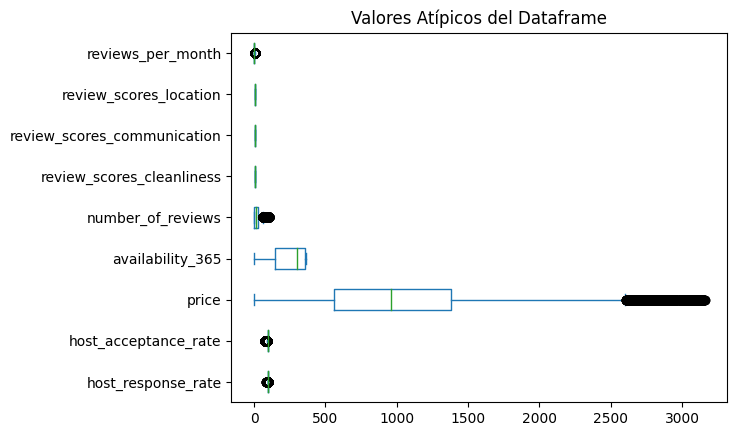

In [444]:
# Hacemos diagrama de caja del df
fig = plt.figure()
df.plot(kind='box', vert=False)
plt.title("Valores Atípicos del Dataframe")
plt.show()

In [445]:
df.isnull().sum()

host_response_rate             0
host_acceptance_rate           0
price                          0
availability_365               0
number_of_reviews              0
review_scores_cleanliness      0
review_scores_communication    0
review_scores_location         0
reviews_per_month              0
dtype: int64

In [446]:
df.columns

Index(['host_response_rate', 'host_acceptance_rate', 'price',
       'availability_365', 'number_of_reviews', 'review_scores_cleanliness',
       'review_scores_communication', 'review_scores_location',
       'reviews_per_month'],
      dtype='object')

In [447]:
df_1 = pd.concat([df_tipocuarto,df], axis = 1)
df_1.rename(columns = {0: 'host_response_rate', 1: 'host_acceptance_rate', 2: 'price',
       3: 'availability_365', 4: 'number_of_reviews', 5: 'review_scores_cleanliness',
       6: 'review_scores_communication', 7: 'review_scores_location',
       8: 'reviews_per_month'}, inplace = True)
df_1

,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...
24219,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24221,Private room,94.538778,96.000000,533.0,180,0,4.746342,4.815533,4.832627,1.702435
24222,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


#**Entire home/apt**

In [448]:
df_entire_home_apt = df_1[df_1['room_type'] == 'Entire home/apt']

##**host_acceptance_rate vs host_response_rate**

<Axes: xlabel='host_response_rate', ylabel='host_acceptance_rate'>

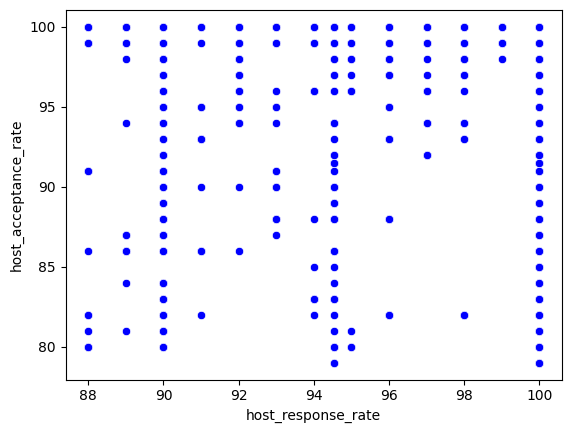

In [449]:
from turtle import color


sns.scatterplot(x='host_response_rate', y='host_acceptance_rate', color="blue", data=df_entire_home_apt)

In [450]:
Vars_Indep= df_entire_home_apt[['host_response_rate']]
Var_Dep= df_entire_home_apt['host_acceptance_rate']

from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['host_response_rate'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([0.38120906]),
 'rank_': 1,
 'singular_': array([295.27671925]),
 'intercept_': 59.981215040417005}

**modelo matemático y = 59.98 + 0.38x**

In [451]:
y_pred= model.predict(X=df_entire_home_apt[['host_response_rate']])
y_pred

array([98.10212068, 96.02025348, 98.10212068, ..., 96.02025348,
       98.10212068, 96.02025348])

In [452]:
df_entire_home_apt_01 = df_entire_home_apt.copy()

In [453]:
df_entire_home_apt_01.insert(0, 'Predicciones', y_pred)
df_entire_home_apt_01

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,98.102121,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,96.020253,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,98.102121,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,96.020253,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,98.102121,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...,...
24217,98.102121,Entire home/apt,100.000000,100.000000,980.0,342,0,4.746342,4.815533,4.832627,1.702435
24219,98.102121,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,96.020253,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24222,98.102121,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='host_response_rate', ylabel='host_acceptance_rate'>

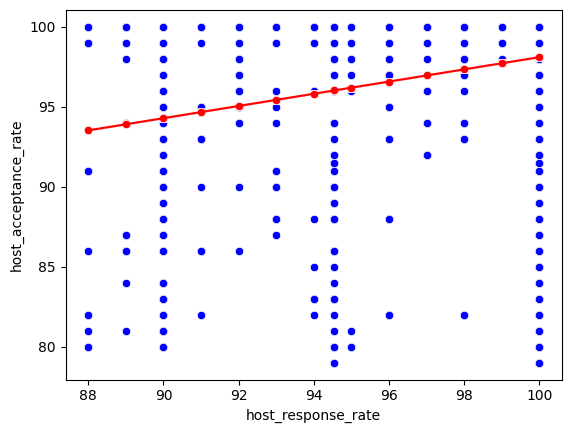

In [454]:
sns.scatterplot(x='host_response_rate',
                y='host_acceptance_rate',
                color="blue",
                data=df_entire_home_apt_01)
sns.scatterplot(x='host_response_rate',
                y='Predicciones',
                color="red",
                data=df_entire_home_apt_01)
sns.lineplot(x='host_response_rate',
             y='Predicciones',
             color="red",
             data=df_entire_home_apt_01)

In [455]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_01_01=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_01_01

0.04854956217642714

In [456]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_01_01=np.sqrt(coef_Deter_01_01)
coef_Correl_01_01

0.22033965184783955

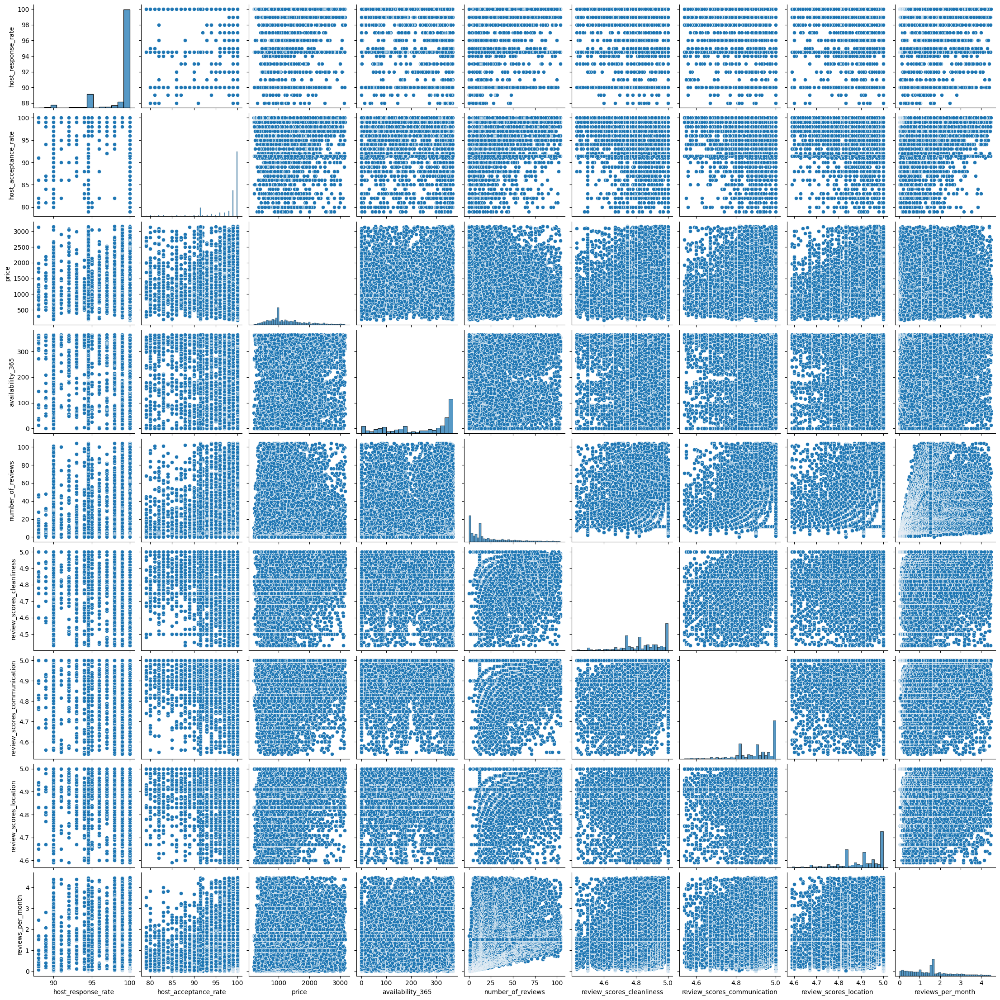

In [457]:
#Graficamos todas las dispersiones entre todas las variables
sns.pairplot(df_entire_home_apt)

##**availability_365 vs number_of_reviews**

<Axes: xlabel='number_of_reviews', ylabel='availability_365'>

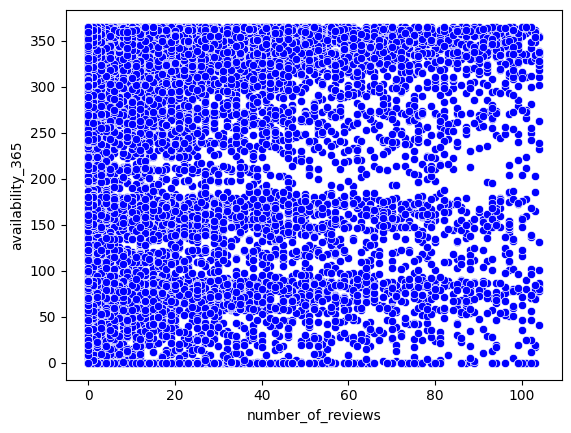

In [458]:
from turtle import color


sns.scatterplot(x='number_of_reviews', y='availability_365', color="blue", data=df_entire_home_apt)

In [459]:
Vars_Indep= df_entire_home_apt[['number_of_reviews']]
Var_Dep= df_entire_home_apt['availability_365']

In [460]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [461]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['number_of_reviews'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([-0.29596254]),
 'rank_': 1,
 'singular_': array([3075.2583904]),
 'intercept_': 247.28960577810722}

**modelo matemático y = 247.28.98 - 0.29x**

In [462]:
y_pred= model.predict(X=df_entire_home_apt[['number_of_reviews']])
y_pred

array([241.07439239, 229.2358907 , 235.74706663, ..., 247.28960578,
       247.28960578, 247.28960578])

In [463]:
df_entire_home_apt_02 = df_entire_home_apt.copy()

In [464]:
#Insertamos la columna de predicciones en el DataFrame
df_entire_home_apt_02.insert(0, 'Predicciones', y_pred)
df_entire_home_apt_02

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,241.074392,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,229.235891,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,235.747067,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,247.289606,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,228.348003,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...,...
24217,247.289606,Entire home/apt,100.000000,100.000000,980.0,342,0,4.746342,4.815533,4.832627,1.702435
24219,247.289606,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,247.289606,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24222,247.289606,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='number_of_reviews', ylabel='availability_365'>

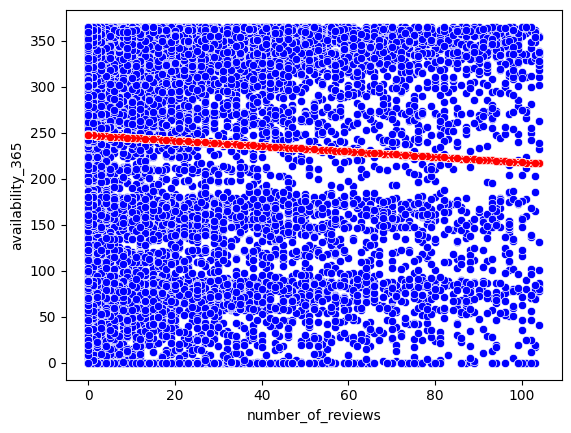

In [465]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='number_of_reviews',
                y='availability_365',
                color="blue",
                data=df_entire_home_apt_02)
sns.scatterplot(x='number_of_reviews',
                y='Predicciones',
                color="red",
                data=df_entire_home_apt_02)
sns.lineplot(x='number_of_reviews',
             y='Predicciones',
             color="red",
             data=df_entire_home_apt_02)

In [466]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_01_02=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_01_02

0.0034989798325099075

In [467]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_01_02=np.sqrt(coef_Deter_01_02)
coef_Correl_01_02

0.059152175213680075

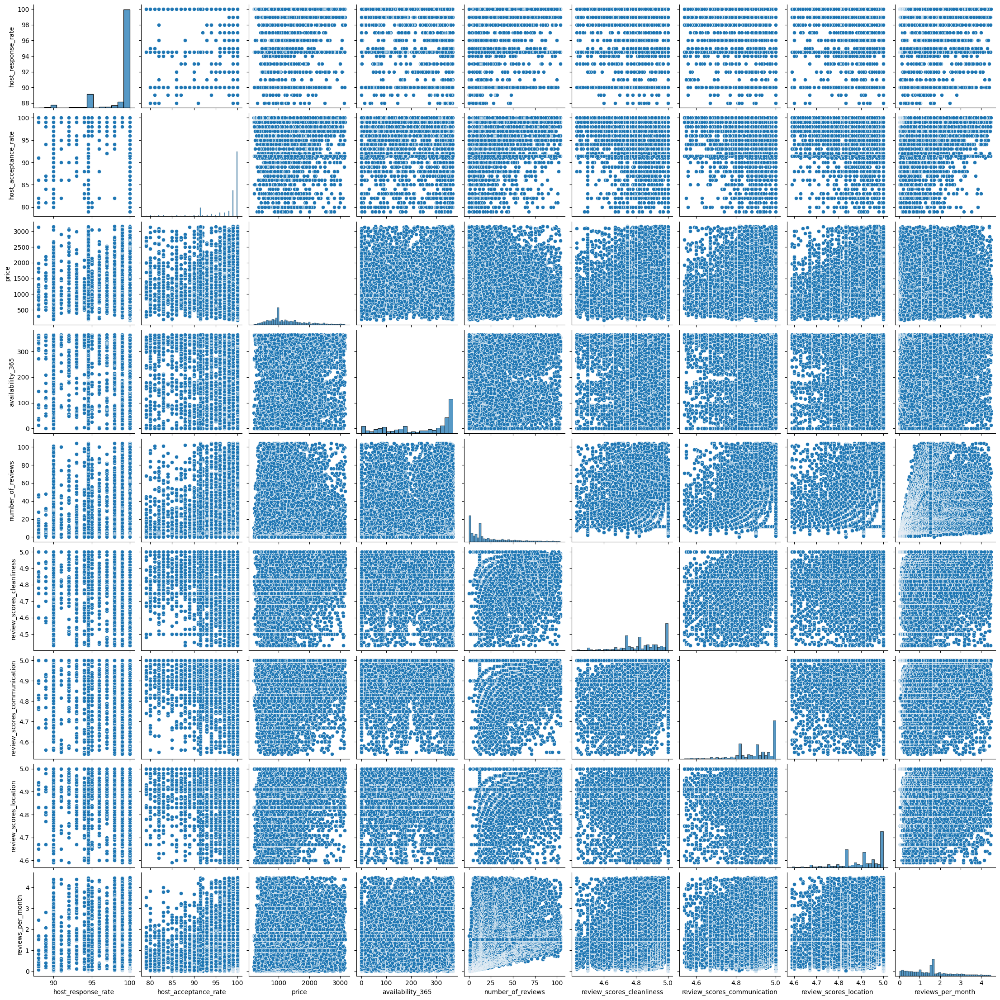

In [468]:
#Graficamos todas las dispersiones entre todas las variables
sns.pairplot(df_entire_home_apt)

In [469]:
df_entire_home_apt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15602 entries, 0 to 24223
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   room_type                    15602 non-null  object 
 1   host_response_rate           15602 non-null  float64
 2   host_acceptance_rate         15602 non-null  float64
 3   price                        15602 non-null  float64
 4   availability_365             15602 non-null  int64  
 5   number_of_reviews            15602 non-null  int64  
 6   review_scores_cleanliness    15602 non-null  float64
 7   review_scores_communication  15602 non-null  float64
 8   review_scores_location       15602 non-null  float64
 9   reviews_per_month            15602 non-null  float64
dtypes: float64(7), int64(2), object(1)
memory usage: 1.3+ MB


##**review_scores_location vs review_scores_cleanliness**

<Axes: xlabel='review_scores_cleanliness', ylabel='review_scores_location'>

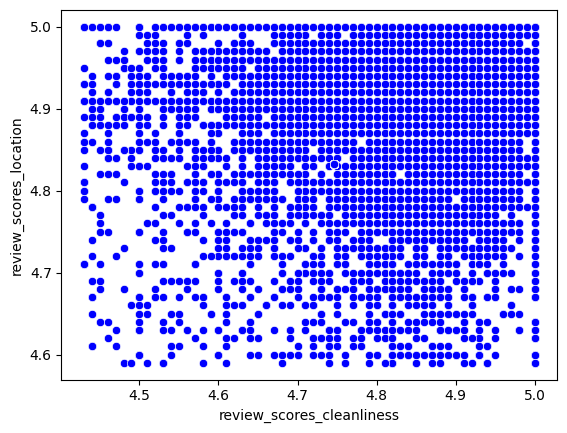

In [470]:
from turtle import color


sns.scatterplot(x='review_scores_cleanliness', y='review_scores_location', color="blue", data=df_entire_home_apt)

In [471]:
Vars_Indep= df_entire_home_apt[['review_scores_cleanliness']]
Var_Dep= df_entire_home_apt['review_scores_location']

In [472]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [473]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['review_scores_cleanliness'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([0.19380421]),
 'rank_': 1,
 'singular_': array([16.78827452]),
 'intercept_': 3.9635774409227076}

**modelo matemático y = 3.96 + 0.19x**

In [474]:
y_pred= model.predict(X=df_entire_home_apt[['review_scores_cleanliness']])
y_pred

array([4.92290827, 4.90934197, 4.87639526, ..., 4.88343845, 4.88343845,
       4.88343845])

In [475]:
df_entire_home_apt_03 = df_entire_home_apt.copy()

In [476]:
#Insertamos la columna de predicciones en el DataFrame
df_entire_home_apt_03.insert(0, 'Predicciones', y_pred)
df_entire_home_apt_03

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,4.922908,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,4.909342,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,4.876395,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,4.883438,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,4.874457,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...,...
24217,4.883438,Entire home/apt,100.000000,100.000000,980.0,342,0,4.746342,4.815533,4.832627,1.702435
24219,4.883438,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,4.883438,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24222,4.883438,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='review_scores_cleanliness', ylabel='review_scores_location'>

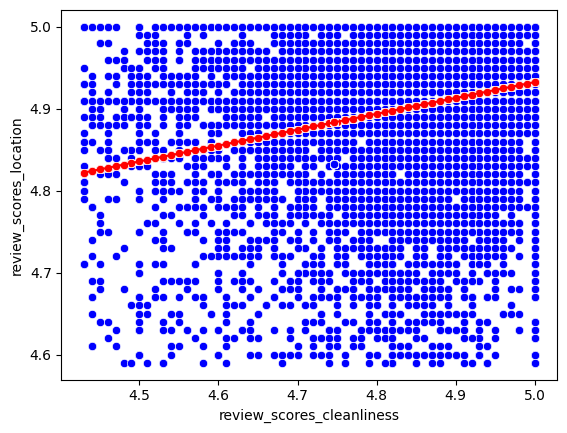

In [477]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='review_scores_cleanliness',
                y='review_scores_location',
                color="blue",
                data=df_entire_home_apt_03)
sns.scatterplot(x='review_scores_cleanliness',
                y='Predicciones',
                color="red",
                data=df_entire_home_apt_03)
sns.lineplot(x='review_scores_cleanliness',
             y='Predicciones',
             color="red",
             data=df_entire_home_apt_03)

In [478]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_01_03=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_01_03

0.07457033684741388

In [479]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_01_03=np.sqrt(coef_Deter_01_03)
coef_Correl_01_03

0.27307569801689396

##**host_acceptance_rate vs price**

<Axes: xlabel='price', ylabel='host_acceptance_rate'>

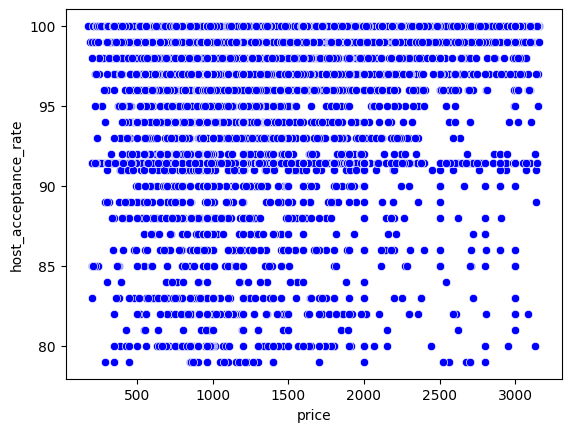

In [480]:
from turtle import color


sns.scatterplot(x='price', y='host_acceptance_rate', color="blue", data=df_entire_home_apt)

In [481]:
Vars_Indep= df_entire_home_apt[['price']]
Var_Dep= df_entire_home_apt['host_acceptance_rate']

In [482]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [483]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['price'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([0.00024091]),
 'rank_': 1,
 'singular_': array([77409.18792146]),
 'intercept_': 97.39459885836938}

**modelo matemático y = 97.39 + 0.00024x**

In [484]:
y_pred= model.predict(X=df_entire_home_apt[['price']])
y_pred

array([97.74006959, 97.59455751, 97.74850158, ..., 97.76078819,
       97.6836957 , 97.808971  ])

In [485]:
df_entire_home_apt_04 = df_entire_home_apt.copy()

In [486]:
#Insertamos la columna de predicciones en el DataFrame
df_entire_home_apt_04.insert(0, 'Predicciones', y_pred)
df_entire_home_apt_04

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,97.740070,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,97.594558,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,97.748502,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,97.625876,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,97.625876,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...,...
24217,97.630695,Entire home/apt,100.000000,100.000000,980.0,342,0,4.746342,4.815533,4.832627,1.702435
24219,97.577694,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,97.760788,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24222,97.683696,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='price', ylabel='host_acceptance_rate'>

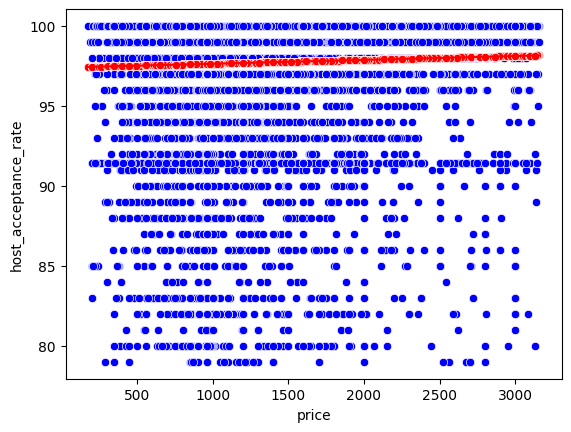

In [487]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='price',
                y='host_acceptance_rate',
                color="blue",
                data=df_entire_home_apt_04)
sns.scatterplot(x='price',
                y='Predicciones',
                color="red",
                data=df_entire_home_apt_04)
sns.lineplot(x='price',
             y='Predicciones',
             color="red",
             data=df_entire_home_apt_04)

In [488]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_01_04=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_01_04

0.001332630395515011

In [489]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_01_04=np.sqrt(coef_Deter_01_04)
coef_Correl_01_04

0.036505210525553895

##**host_acceptance_rate vs number_of_reviews**

<Axes: xlabel='number_of_reviews', ylabel='host_acceptance_rate'>

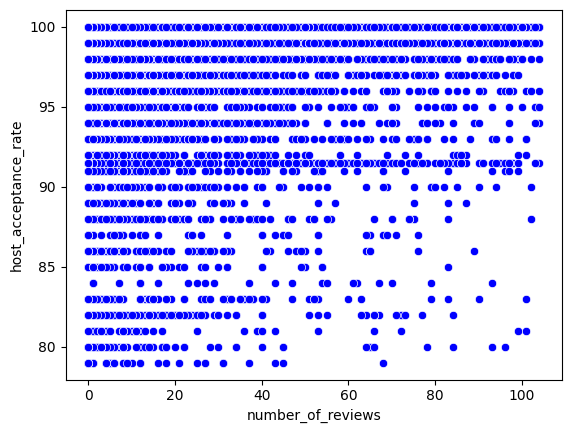

In [490]:
from turtle import color


sns.scatterplot(x='number_of_reviews', y='host_acceptance_rate', color="blue", data=df_entire_home_apt)

In [491]:
Vars_Indep= df_entire_home_apt[['number_of_reviews']]
Var_Dep= df_entire_home_apt['host_acceptance_rate']

In [492]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [493]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['number_of_reviews'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([0.0125636]),
 'rank_': 1,
 'singular_': array([3075.2583904]),
 'intercept_': 97.42157114451192}

**modelo matemático y = 97.42 + 0.012x**

In [494]:
y_pred= model.predict(X=df_entire_home_apt[['number_of_reviews']])
y_pred

array([97.68540682, 98.18795097, 97.91155169, ..., 97.42157114,
       97.42157114, 97.42157114])

In [495]:
df_entire_home_apt_05 = df_entire_home_apt.copy()

In [496]:
#Insertamos la columna de predicciones en el DataFrame
df_entire_home_apt_05.insert(0, 'Predicciones', y_pred)
df_entire_home_apt_05

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,97.685407,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,98.187951,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,97.911552,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,97.421571,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,98.225642,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...,...
24217,97.421571,Entire home/apt,100.000000,100.000000,980.0,342,0,4.746342,4.815533,4.832627,1.702435
24219,97.421571,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,97.421571,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24222,97.421571,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='number_of_reviews', ylabel='host_acceptance_rate'>

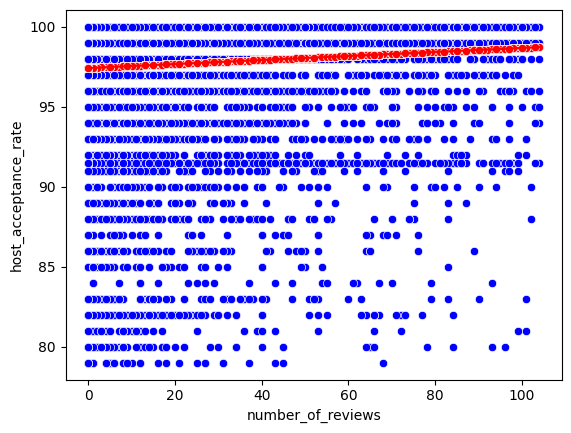

In [497]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='number_of_reviews',
                y='host_acceptance_rate',
                color="blue",
                data=df_entire_home_apt_05)
sns.scatterplot(x='number_of_reviews',
                y='Predicciones',
                color="red",
                data=df_entire_home_apt_05)
sns.lineplot(x='number_of_reviews',
             y='Predicciones',
             color="red",
             data=df_entire_home_apt_05)

In [498]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_01_05=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_01_05

0.005719949060588259

In [499]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_01_05=np.sqrt(coef_Deter_01_05)
coef_Correl_01_05

0.0756303448398079

##**reviews_per_month vs review_scores_communication**

<Axes: xlabel='review_scores_communication', ylabel='reviews_per_month'>

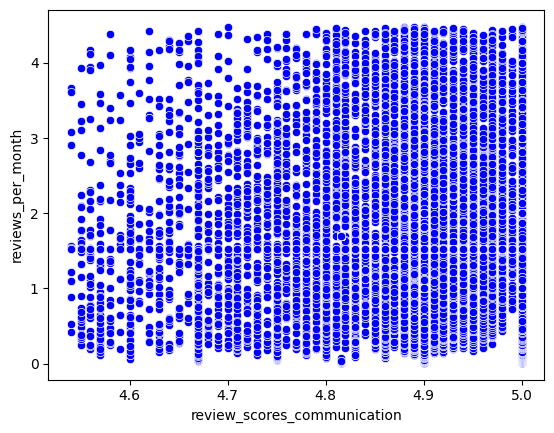

In [500]:
from turtle import color


sns.scatterplot(x='review_scores_communication', y='reviews_per_month', color="blue", data=df_entire_home_apt)

In [501]:
Vars_Indep= df_entire_home_apt[['review_scores_communication']]
Var_Dep= df_entire_home_apt['reviews_per_month']

In [502]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [503]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['review_scores_communication'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([-1.25379744]),
 'rank_': 1,
 'singular_': array([12.64119502]),
 'intercept_': 7.7113797394272865}

**modelo matemático y = 7.71 - 1.25x**

In [504]:
y_pred= model.predict(X=df_entire_home_apt[['review_scores_communication']])
y_pred

array([1.50508241, 1.44239253, 1.54269633, ..., 1.67367648, 1.67367648,
       1.67367648])

In [505]:
df_entire_home_apt_06 = df_entire_home_apt.copy()

In [506]:
#Insertamos la columna de predicciones en el DataFrame
df_entire_home_apt_06.insert(0, 'Predicciones', y_pred)
df_entire_home_apt_06

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,1.505082,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,1.442393,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,1.542696,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,1.673676,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,1.718228,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...,...
24217,1.673676,Entire home/apt,100.000000,100.000000,980.0,342,0,4.746342,4.815533,4.832627,1.702435
24219,1.673676,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,1.673676,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24222,1.673676,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='review_scores_communication', ylabel='reviews_per_month'>

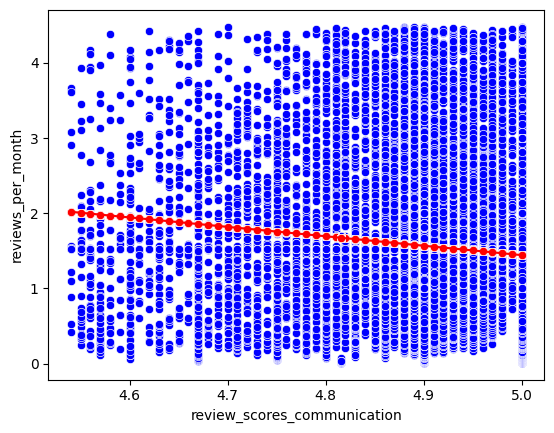

In [507]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='review_scores_communication',
                y='reviews_per_month',
                color="blue",
                data=df_entire_home_apt_06)
sns.scatterplot(x='review_scores_communication',
                y='Predicciones',
                color="red",
                data=df_entire_home_apt_06)
sns.lineplot(x='review_scores_communication',
             y='Predicciones',
             color="red",
             data=df_entire_home_apt_06)

In [508]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_01_06=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_01_06

0.014647453193404658

In [509]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_01_06=np.sqrt(coef_Deter_01_06)
coef_Correl_01_06

0.12102666315074814

#**Shared room**

In [510]:
df_shared_room = df_1[df_1['room_type'] == 'Shared room']

##**host_acceptance_rate vs host_response_rate**

<Axes: xlabel='host_response_rate', ylabel='host_acceptance_rate'>

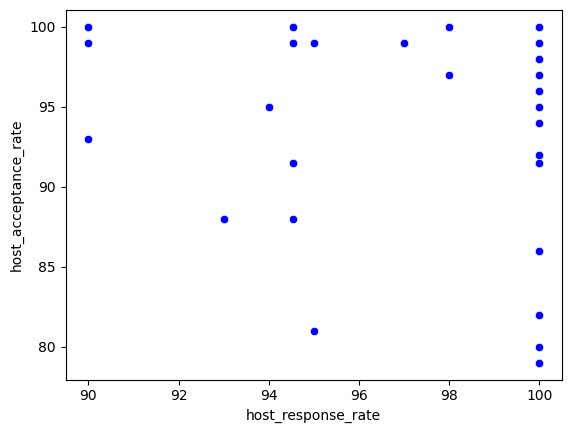

In [511]:
from turtle import color


sns.scatterplot(x='host_response_rate', y='host_acceptance_rate', color="blue", data=df_shared_room)

In [512]:
Vars_Indep= df_shared_room[['host_response_rate']]
Var_Dep= df_shared_room['host_acceptance_rate']

from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['host_response_rate'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([0.35241372]),
 'rank_': 1,
 'singular_': array([44.97212717]),
 'intercept_': 62.51109989855608}

**modelo matemático y = 62.51 + 0.35x**

In [513]:
y_pred= model.predict(X=df_shared_room[['host_response_rate']])
y_pred

array([95.8278627 , 97.75247221, 94.22833498, 97.75247221, 97.75247221,
       97.75247221, 95.99040359, 97.75247221, 94.22833498, 95.8278627 ,
       97.75247221, 97.75247221, 97.75247221, 95.99040359, 95.8278627 ,
       97.75247221, 97.75247221, 97.75247221, 95.8278627 , 97.75247221,
       95.8278627 , 97.75247221, 97.75247221, 95.8278627 , 95.8278627 ,
       97.75247221, 95.8278627 , 97.75247221, 95.8278627 , 94.22833498,
       95.8278627 , 95.8278627 , 95.8278627 , 97.75247221, 97.75247221,
       97.75247221, 97.75247221, 97.75247221, 95.8278627 , 97.75247221,
       95.8278627 , 97.75247221, 95.8278627 , 95.8278627 , 97.75247221,
       97.75247221, 95.8278627 , 97.75247221, 95.8278627 , 97.75247221,
       97.75247221, 97.75247221, 97.75247221, 97.75247221, 97.75247221,
       97.75247221, 97.75247221, 97.75247221, 97.75247221, 95.8278627 ,
       95.8278627 , 97.75247221, 97.75247221, 97.75247221, 97.75247221,
       97.75247221, 97.75247221, 97.75247221, 97.75247221, 97.75

In [514]:
df_shared_room_01 = df_shared_room.copy()

In [515]:
df_shared_room_01.insert(0, 'Predicciones', y_pred)
df_shared_room_01

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
174,95.827863,Shared room,94.538778,99.000000,1815.0,365,0,4.746342,4.815533,4.832627,1.702435
437,97.752472,Shared room,100.000000,86.000000,182.0,346,9,4.670000,5.000000,4.780000,0.100000
443,94.228335,Shared room,90.000000,100.000000,450.0,302,70,4.930000,4.910000,4.680000,0.730000
472,97.752472,Shared room,100.000000,96.000000,272.0,354,25,4.480000,4.720000,4.800000,0.260000
499,97.752472,Shared room,100.000000,100.000000,320.0,351,12,4.620000,4.900000,4.900000,1.470000
...,...,...,...,...,...,...,...,...,...,...,...
23733,97.752472,Shared room,100.000000,100.000000,250.0,365,0,4.746342,4.815533,4.832627,1.702435
23762,97.752472,Shared room,100.000000,100.000000,224.0,364,0,4.746342,4.815533,4.832627,1.702435
23894,95.827863,Shared room,94.538778,91.456246,720.0,364,0,4.746342,4.815533,4.832627,1.702435
23898,97.752472,Shared room,100.000000,91.456246,176.0,364,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='host_response_rate', ylabel='host_acceptance_rate'>

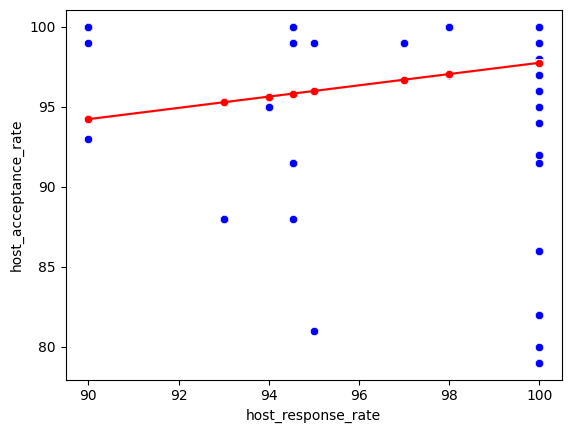

In [516]:
sns.scatterplot(x='host_response_rate',
                y='host_acceptance_rate',
                color="blue",
                data=df_shared_room_01)
sns.scatterplot(x='host_response_rate',
                y='Predicciones',
                color="red",
                data=df_shared_room_01)
sns.lineplot(x='host_response_rate',
             y='Predicciones',
             color="red",
             data=df_shared_room_01)

In [517]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_02_01=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_02_01

0.044347279950202156

In [518]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_02_01=np.sqrt(coef_Deter_02_01)
coef_Correl_02_01

0.2105879387576652

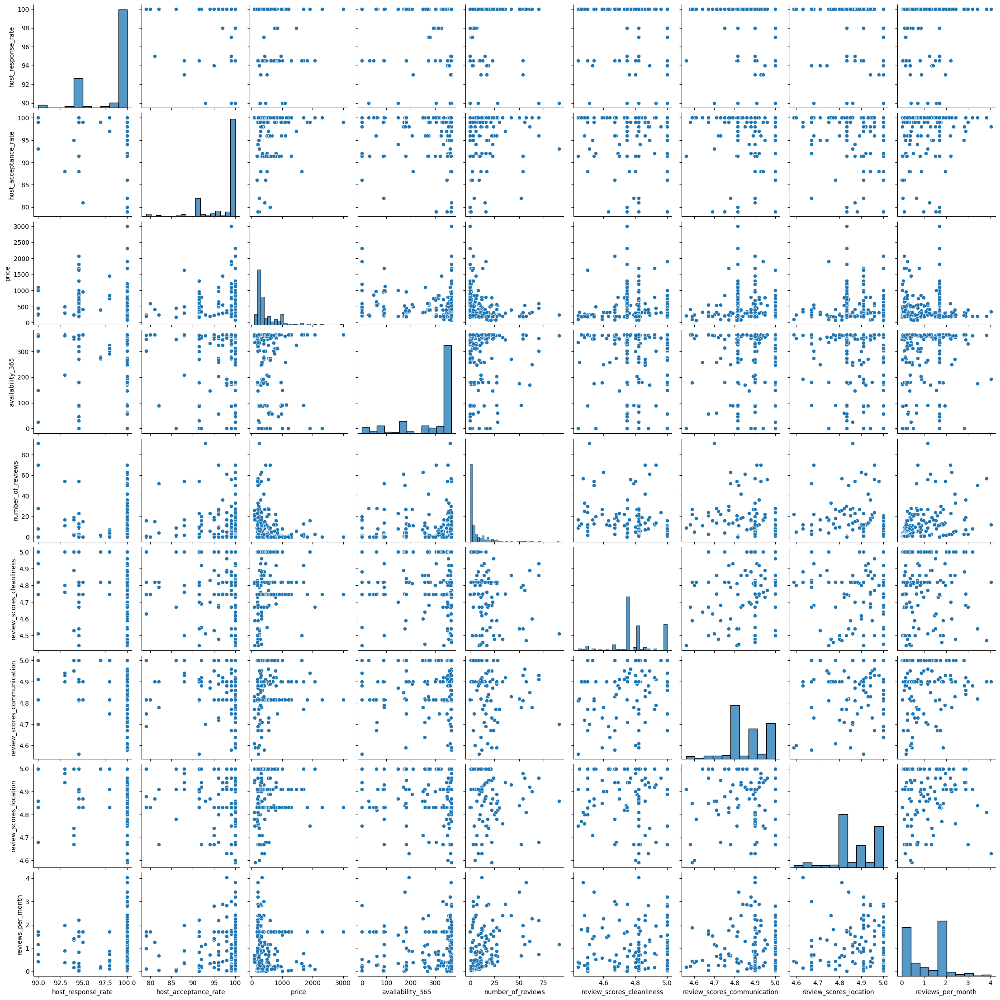

In [519]:
#Graficamos todas las dispersiones entre todas las variables
sns.pairplot(df_shared_room)

##**availability_365 vs number_of_reviews**

<Axes: xlabel='number_of_reviews', ylabel='availability_365'>

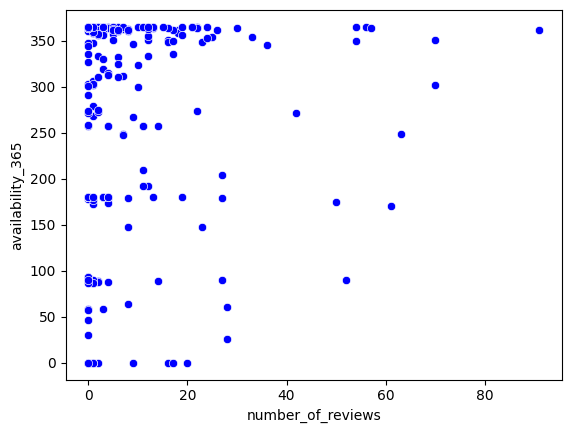

In [520]:
from turtle import color


sns.scatterplot(x='number_of_reviews', y='availability_365', color="blue", data=df_shared_room)

In [521]:
Vars_Indep= df_shared_room[['number_of_reviews']]
Var_Dep= df_shared_room['availability_365']

In [522]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [523]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['number_of_reviews'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([-0.38530368]),
 'rank_': 1,
 'singular_': array([228.70872126]),
 'intercept_': 298.7306252385629}

**modelo matemático y = 298.73 - 0.38x**

In [524]:
y_pred= model.predict(X=df_shared_room[['number_of_reviews']])
y_pred

array([298.73062524, 295.26289212, 271.75936762, 289.09803323,
       294.10698107, 298.73062524, 298.73062524, 298.34532156,
       263.66799033, 298.73062524, 297.96001788, 292.56576635,
       294.10698107, 298.73062524, 298.73062524, 298.73062524,
       278.69483386, 297.18941052, 298.73062524, 296.41880316,
       298.73062524, 289.86864059, 292.56576635, 298.73062524,
       298.34532156, 298.73062524, 297.96001788, 294.10698107,
       298.34532156, 287.94212219, 298.34532156, 293.72167739,
       298.34532156, 296.03349948, 298.73062524, 298.73062524,
       295.6481958 , 298.34532156, 298.73062524, 298.34532156,
       298.73062524, 298.73062524, 298.73062524, 297.5747142 ,
       294.10698107, 290.25394427, 298.34532156, 297.96001788,
       298.34532156, 297.18941052, 295.6481958 , 296.80410684,
       297.5747142 , 298.34532156, 291.40985531, 296.80410684,
       297.5747142 , 297.5747142 , 298.73062524, 298.34532156,
       295.26289212, 277.15361914, 275.22710074, 298.34

In [525]:
df_shared_room_02 = df_shared_room.copy()

In [526]:
#Insertamos la columna de predicciones en el DataFrame
df_shared_room_02.insert(0, 'Predicciones', y_pred)
df_shared_room_02

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
174,298.730625,Shared room,94.538778,99.000000,1815.0,365,0,4.746342,4.815533,4.832627,1.702435
437,295.262892,Shared room,100.000000,86.000000,182.0,346,9,4.670000,5.000000,4.780000,0.100000
443,271.759368,Shared room,90.000000,100.000000,450.0,302,70,4.930000,4.910000,4.680000,0.730000
472,289.098033,Shared room,100.000000,96.000000,272.0,354,25,4.480000,4.720000,4.800000,0.260000
499,294.106981,Shared room,100.000000,100.000000,320.0,351,12,4.620000,4.900000,4.900000,1.470000
...,...,...,...,...,...,...,...,...,...,...,...
23733,298.730625,Shared room,100.000000,100.000000,250.0,365,0,4.746342,4.815533,4.832627,1.702435
23762,298.730625,Shared room,100.000000,100.000000,224.0,364,0,4.746342,4.815533,4.832627,1.702435
23894,298.730625,Shared room,94.538778,91.456246,720.0,364,0,4.746342,4.815533,4.832627,1.702435
23898,298.730625,Shared room,100.000000,91.456246,176.0,364,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='number_of_reviews', ylabel='availability_365'>

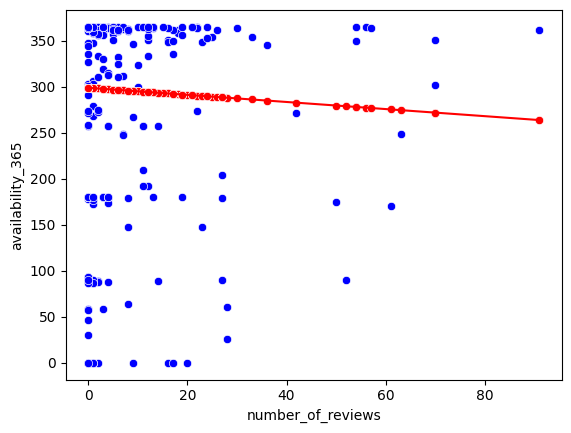

In [527]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='number_of_reviews',
                y='availability_365',
                color="blue",
                data=df_shared_room_02)
sns.scatterplot(x='number_of_reviews',
                y='Predicciones',
                color="red",
                data=df_shared_room_02)
sns.lineplot(x='number_of_reviews',
             y='Predicciones',
             color="red",
             data=df_shared_room_02)

In [528]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_02_02=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_02_02

0.0023075654592844552

In [529]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_02_02=np.sqrt(coef_Deter_02_02)
coef_Correl_02_02

0.04803712584329391

In [530]:
df_shared_room.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 174 to 24173
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   room_type                    293 non-null    object 
 1   host_response_rate           293 non-null    float64
 2   host_acceptance_rate         293 non-null    float64
 3   price                        293 non-null    float64
 4   availability_365             293 non-null    int64  
 5   number_of_reviews            293 non-null    int64  
 6   review_scores_cleanliness    293 non-null    float64
 7   review_scores_communication  293 non-null    float64
 8   review_scores_location       293 non-null    float64
 9   reviews_per_month            293 non-null    float64
dtypes: float64(7), int64(2), object(1)
memory usage: 25.2+ KB


##**review_scores_location vs review_scores_cleanliness**

<Axes: xlabel='review_scores_cleanliness', ylabel='review_scores_location'>

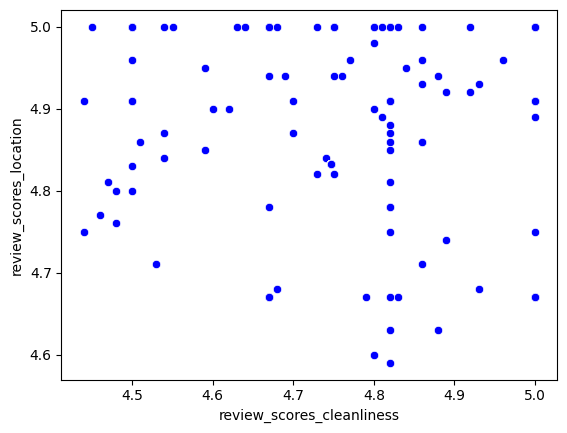

In [531]:
from turtle import color


sns.scatterplot(x='review_scores_cleanliness', y='review_scores_location', color="blue", data=df_shared_room)

In [532]:
Vars_Indep= df_shared_room[['review_scores_cleanliness']]
Var_Dep= df_shared_room['review_scores_location']

In [533]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [534]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['review_scores_cleanliness'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([0.19140588]),
 'rank_': 1,
 'singular_': array([2.27937361]),
 'intercept_': 3.967707261551559}

**modelo matemático y = 3.96 + 0.19x**

In [535]:
y_pred= model.predict(X=df_shared_room[['review_scores_cleanliness']])
y_pred

array([4.87618498, 4.86157271, 4.91133823, 4.82520559, 4.85200241,
       4.87618498, 4.87618498, 4.92473664, 4.83094776, 4.87618498,
       4.82903371, 4.86540082, 4.90942417, 4.87618498, 4.87618498,
       4.87618498, 4.88454141, 4.89028359, 4.87618498, 4.89219765,
       4.87618498, 4.86731488, 4.92473664, 4.87618498, 4.92473664,
       4.87618498, 4.89028359, 4.87497112, 4.92473664, 4.89028359,
       4.87618498, 4.87688518, 4.89028359, 4.89793982, 4.87618498,
       4.87618498, 4.90176794, 4.92473664, 4.87618498, 4.89028359,
       4.87618498, 4.87618498, 4.87618498, 4.89028359, 4.86157271,
       4.89028359, 4.89028359, 4.92473664, 4.89028359, 4.89028359,
       4.87688518, 4.92473664, 4.86157271, 4.89028359, 4.8941117 ,
       4.88645547, 4.92473664, 4.89028359, 4.87618498, 4.89028359,
       4.81754935, 4.88071329, 4.903682  , 4.92473664, 4.89028359,
       4.92473664, 4.87688518, 4.87618498, 4.87688518, 4.87618498,
       4.87618498, 4.87618498, 4.87618498, 4.87618498, 4.87618

In [536]:
df_shared_room_03 = df_shared_room.copy()

In [537]:
#Insertamos la columna de predicciones en el DataFrame
df_shared_room_03.insert(0, 'Predicciones', y_pred)
df_shared_room_03

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
174,4.876185,Shared room,94.538778,99.000000,1815.0,365,0,4.746342,4.815533,4.832627,1.702435
437,4.861573,Shared room,100.000000,86.000000,182.0,346,9,4.670000,5.000000,4.780000,0.100000
443,4.911338,Shared room,90.000000,100.000000,450.0,302,70,4.930000,4.910000,4.680000,0.730000
472,4.825206,Shared room,100.000000,96.000000,272.0,354,25,4.480000,4.720000,4.800000,0.260000
499,4.852002,Shared room,100.000000,100.000000,320.0,351,12,4.620000,4.900000,4.900000,1.470000
...,...,...,...,...,...,...,...,...,...,...,...
23733,4.876185,Shared room,100.000000,100.000000,250.0,365,0,4.746342,4.815533,4.832627,1.702435
23762,4.876185,Shared room,100.000000,100.000000,224.0,364,0,4.746342,4.815533,4.832627,1.702435
23894,4.876185,Shared room,94.538778,91.456246,720.0,364,0,4.746342,4.815533,4.832627,1.702435
23898,4.876185,Shared room,100.000000,91.456246,176.0,364,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='review_scores_cleanliness', ylabel='review_scores_location'>

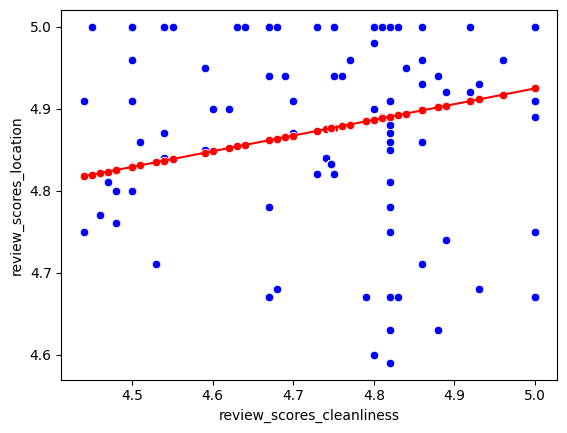

In [538]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='review_scores_cleanliness',
                y='review_scores_location',
                color="blue",
                data=df_shared_room_03)
sns.scatterplot(x='review_scores_cleanliness',
                y='Predicciones',
                color="red",
                data=df_shared_room_03)
sns.lineplot(x='review_scores_cleanliness',
             y='Predicciones',
             color="red",
             data=df_shared_room_03)

In [539]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_02_03=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_02_03

0.07503098052105395

In [540]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_02_03=np.sqrt(coef_Deter_02_03)
coef_Correl_02_03

0.27391783534675856

##**host_acceptance_rate vs price**

<Axes: xlabel='price', ylabel='host_acceptance_rate'>

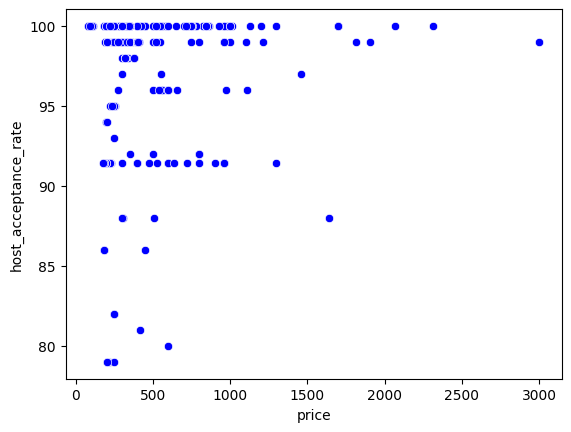

In [541]:
from turtle import color


sns.scatterplot(x='price', y='host_acceptance_rate', color="blue", data=df_shared_room)

In [542]:
Vars_Indep= df_shared_room[['price']]
Var_Dep= df_shared_room['host_acceptance_rate']

In [543]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [544]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['price'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([-9.28299686e-05]),
 'rank_': 1,
 'singular_': array([6757.86119102]),
 'intercept_': 97.23497756654437}

**modelo matemático y = 97.23 - 9.28x**

In [545]:
y_pred= model.predict(X=df_shared_room[['price']])
y_pred

array([97.06649117, 97.21808251, 97.19320408, 97.20972782, 97.20527198,
       97.21641157, 97.1458608 , 97.21808251, 97.21214139, 97.1458608 ,
       97.21436931, 97.16080642, 97.16080642, 97.1458608 , 97.1458608 ,
       97.1982169 , 97.21177007, 97.21177007, 97.20248708, 97.21678289,
       97.20128029, 97.21613308, 97.05804365, 97.1458608 , 97.20443651,
       97.21399799, 97.18856258, 97.16721169, 97.20712858, 97.21177007,
       97.20991348, 97.19320408, 97.21641157, 97.20248708, 97.21715421,
       97.20712858, 97.19663879, 97.21641157, 97.20248708, 97.2146478 ,
       97.11429861, 97.1458608 , 97.17927959, 97.11429861, 97.19663879,
       97.22476627, 97.16999659, 97.19320408, 97.18856258, 97.21724704,
       97.20434368, 97.17463809, 97.20434368, 97.1421476 , 97.20517915,
       97.21177007, 97.20434368, 97.21409082, 96.95648766, 97.19784558,
       97.21511195, 97.18438523, 97.20712858, 97.19784558, 97.18039354,
       97.18308561, 97.18419957, 97.21715421, 97.20248708, 97.19

In [546]:
df_shared_room_04 = df_shared_room.copy()

In [547]:
#Insertamos la columna de predicciones en el DataFrame
df_shared_room_04.insert(0, 'Predicciones', y_pred)
df_shared_room_04

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
174,97.066491,Shared room,94.538778,99.000000,1815.0,365,0,4.746342,4.815533,4.832627,1.702435
437,97.218083,Shared room,100.000000,86.000000,182.0,346,9,4.670000,5.000000,4.780000,0.100000
443,97.193204,Shared room,90.000000,100.000000,450.0,302,70,4.930000,4.910000,4.680000,0.730000
472,97.209728,Shared room,100.000000,96.000000,272.0,354,25,4.480000,4.720000,4.800000,0.260000
499,97.205272,Shared room,100.000000,100.000000,320.0,351,12,4.620000,4.900000,4.900000,1.470000
...,...,...,...,...,...,...,...,...,...,...,...
23733,97.211770,Shared room,100.000000,100.000000,250.0,365,0,4.746342,4.815533,4.832627,1.702435
23762,97.214184,Shared room,100.000000,100.000000,224.0,364,0,4.746342,4.815533,4.832627,1.702435
23894,97.168140,Shared room,94.538778,91.456246,720.0,364,0,4.746342,4.815533,4.832627,1.702435
23898,97.218639,Shared room,100.000000,91.456246,176.0,364,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='price', ylabel='host_acceptance_rate'>

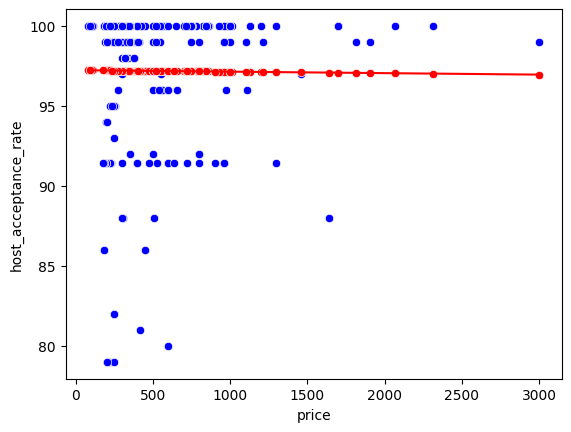

In [548]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='price',
                y='host_acceptance_rate',
                color="blue",
                data=df_shared_room_04)
sns.scatterplot(x='price',
                y='Predicciones',
                color="red",
                data=df_shared_room_04)
sns.lineplot(x='price',
             y='Predicciones',
             color="red",
             data=df_shared_room_04)

In [549]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_02_04=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_02_04

6.948154156616315e-05

In [550]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_02_04=np.sqrt(coef_Deter_02_04)
coef_Correl_02_04

0.008335558863457396

##**host_acceptance_rate vs number_of_reviews**

<Axes: xlabel='number_of_reviews', ylabel='host_acceptance_rate'>

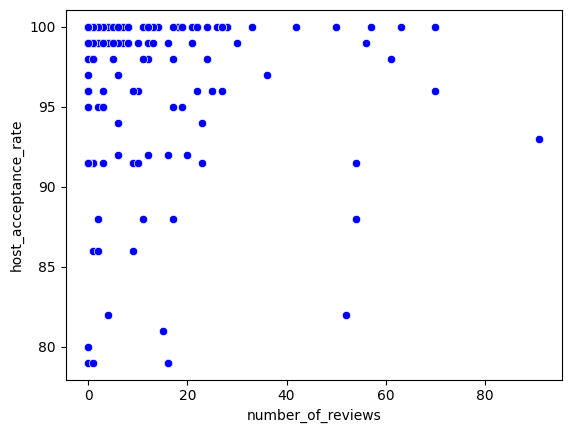

In [551]:
from turtle import color


sns.scatterplot(x='number_of_reviews', y='host_acceptance_rate', color="blue", data=df_shared_room)

In [552]:
Vars_Indep= df_shared_room[['number_of_reviews']]
Var_Dep= df_shared_room['host_acceptance_rate']

In [553]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [554]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['number_of_reviews'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([-0.01715333]),
 'rank_': 1,
 'singular_': array([228.70872126]),
 'intercept_': 97.31627340848631}

**modelo matemático y = 97.31 - 0.017x**

In [555]:
y_pred= model.predict(X=df_shared_room[['number_of_reviews']])
y_pred

array([97.31627341, 97.16189346, 96.11554048, 96.88744022, 97.11043348,
       97.31627341, 97.31627341, 97.29912008, 95.7553206 , 97.31627341,
       97.28196675, 97.04182017, 97.11043348, 97.31627341, 97.31627341,
       97.31627341, 96.42430037, 97.2476601 , 97.31627341, 97.21335344,
       97.31627341, 96.92174687, 97.04182017, 97.31627341, 97.29912008,
       97.31627341, 97.28196675, 97.11043348, 97.29912008, 96.83598024,
       97.29912008, 97.09328015, 97.29912008, 97.19620012, 97.31627341,
       97.31627341, 97.17904679, 97.29912008, 97.31627341, 97.29912008,
       97.31627341, 97.31627341, 97.31627341, 97.26481343, 97.11043348,
       96.9389002 , 97.29912008, 97.28196675, 97.29912008, 97.2476601 ,
       97.17904679, 97.23050677, 97.26481343, 97.29912008, 96.99036018,
       97.23050677, 97.26481343, 97.26481343, 97.31627341, 97.29912008,
       97.16189346, 96.35568706, 96.26992042, 97.29912008, 97.17904679,
       97.26481343, 96.83598024, 97.31627341, 97.2476601 , 97.31

In [556]:
df_shared_room_05 = df_shared_room.copy()

In [557]:
#Insertamos la columna de predicciones en el DataFrame
df_shared_room_05.insert(0, 'Predicciones', y_pred)
df_shared_room_05

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
174,97.316273,Shared room,94.538778,99.000000,1815.0,365,0,4.746342,4.815533,4.832627,1.702435
437,97.161893,Shared room,100.000000,86.000000,182.0,346,9,4.670000,5.000000,4.780000,0.100000
443,96.115540,Shared room,90.000000,100.000000,450.0,302,70,4.930000,4.910000,4.680000,0.730000
472,96.887440,Shared room,100.000000,96.000000,272.0,354,25,4.480000,4.720000,4.800000,0.260000
499,97.110433,Shared room,100.000000,100.000000,320.0,351,12,4.620000,4.900000,4.900000,1.470000
...,...,...,...,...,...,...,...,...,...,...,...
23733,97.316273,Shared room,100.000000,100.000000,250.0,365,0,4.746342,4.815533,4.832627,1.702435
23762,97.316273,Shared room,100.000000,100.000000,224.0,364,0,4.746342,4.815533,4.832627,1.702435
23894,97.316273,Shared room,94.538778,91.456246,720.0,364,0,4.746342,4.815533,4.832627,1.702435
23898,97.316273,Shared room,100.000000,91.456246,176.0,364,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='number_of_reviews', ylabel='host_acceptance_rate'>

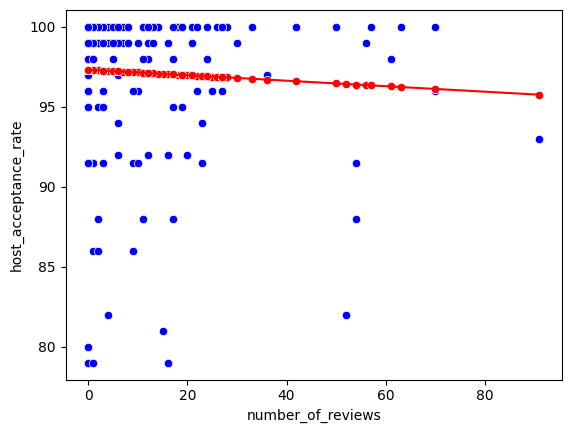

In [558]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='number_of_reviews',
                y='host_acceptance_rate',
                color="blue",
                data=df_shared_room_05)
sns.scatterplot(x='number_of_reviews',
                y='Predicciones',
                color="red",
                data=df_shared_room_05)
sns.lineplot(x='number_of_reviews',
             y='Predicciones',
             color="red",
             data=df_shared_room_05)

In [559]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_02_05=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_02_05

0.002717294564641426

In [560]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_02_05=np.sqrt(coef_Deter_02_05)
coef_Correl_02_05

0.05212767561134321

##**reviews_per_month vs review_scores_communication**

<Axes: xlabel='review_scores_communication', ylabel='reviews_per_month'>

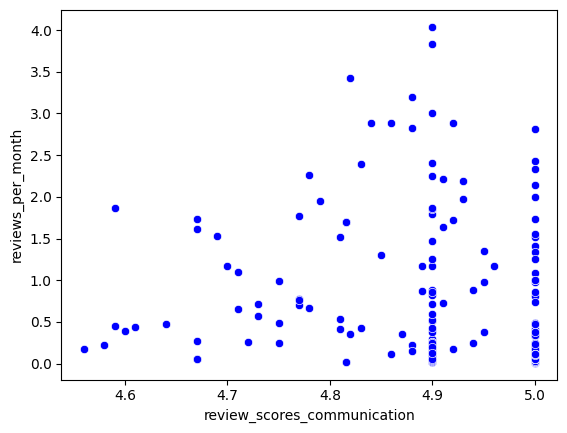

In [561]:
from turtle import color


sns.scatterplot(x='review_scores_communication', y='reviews_per_month', color="blue", data=df_shared_room)

In [562]:
Vars_Indep= df_shared_room[['review_scores_communication']]
Var_Dep= df_shared_room['reviews_per_month']

In [563]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [564]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['review_scores_communication'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([-2.99338004]),
 'rank_': 1,
 'singular_': array([1.64175027]),
 'intercept_': 15.664509693816333}

**modelo matemático y = 15.66 - 2.99x**

In [565]:
y_pred= model.predict(X=df_shared_room[['review_scores_communication']])
y_pred

array([1.24978856, 0.69760947, 0.96701367, 1.53575588, 0.99694748,
       1.24978856, 1.24978856, 0.69760947, 1.59562348, 1.24978856,
       0.99694748, 1.05681508, 0.93707987, 1.24978856, 1.24978856,
       1.24978856, 1.35615308, 0.99694748, 1.24978856, 0.99694748,
       1.24978856, 1.08674888, 0.87721227, 1.24978856, 0.69760947,
       1.24978856, 0.69760947, 0.93707987, 0.69760947, 0.69760947,
       1.24978856, 0.99694748, 0.99694748, 1.11668268, 1.24978856,
       1.24978856, 1.05681508, 0.69760947, 1.24978856, 0.99694748,
       1.24978856, 1.24978856, 1.24978856, 0.99694748, 1.95482909,
       1.92489529, 0.99694748, 0.69760947, 0.99694748, 0.99694748,
       0.69760947, 0.69760947, 1.68542489, 0.99694748, 0.84727847,
       1.89496149, 1.68542489, 0.99694748, 1.24978856, 0.99694748,
       2.01469669, 0.81734467, 1.14661648, 0.99694748, 0.99694748,
       1.68542489, 1.56568968, 1.24978856, 0.69760947, 1.24978856,
       1.24978856, 1.24978856, 1.24978856, 1.24978856, 1.24978

In [566]:
df_shared_room_06 = df_shared_room.copy()

In [567]:
#Insertamos la columna de predicciones en el DataFrame
df_shared_room_06.insert(0, 'Predicciones', y_pred)
df_shared_room_06

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
174,1.249789,Shared room,94.538778,99.000000,1815.0,365,0,4.746342,4.815533,4.832627,1.702435
437,0.697609,Shared room,100.000000,86.000000,182.0,346,9,4.670000,5.000000,4.780000,0.100000
443,0.967014,Shared room,90.000000,100.000000,450.0,302,70,4.930000,4.910000,4.680000,0.730000
472,1.535756,Shared room,100.000000,96.000000,272.0,354,25,4.480000,4.720000,4.800000,0.260000
499,0.996947,Shared room,100.000000,100.000000,320.0,351,12,4.620000,4.900000,4.900000,1.470000
...,...,...,...,...,...,...,...,...,...,...,...
23733,1.249789,Shared room,100.000000,100.000000,250.0,365,0,4.746342,4.815533,4.832627,1.702435
23762,1.249789,Shared room,100.000000,100.000000,224.0,364,0,4.746342,4.815533,4.832627,1.702435
23894,1.249789,Shared room,94.538778,91.456246,720.0,364,0,4.746342,4.815533,4.832627,1.702435
23898,1.249789,Shared room,100.000000,91.456246,176.0,364,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='review_scores_communication', ylabel='reviews_per_month'>

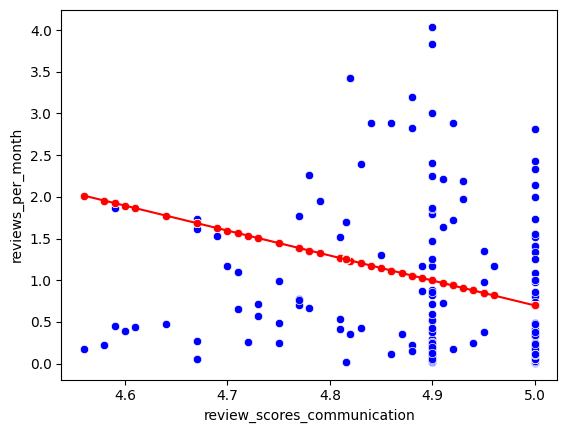

In [568]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='review_scores_communication',
                y='reviews_per_month',
                color="blue",
                data=df_shared_room_06)
sns.scatterplot(x='review_scores_communication',
                y='Predicciones',
                color="red",
                data=df_shared_room_06)
sns.lineplot(x='review_scores_communication',
             y='Predicciones',
             color="red",
             data=df_shared_room_06)

In [569]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_02_06=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_02_06

0.11815335723596132

In [570]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_02_06=np.sqrt(coef_Deter_02_06)
coef_Correl_02_06

0.34373442835416024

#**Modelo matemático para número de reseñas**

##**Entire home/apt**

###**number_of_reviews vs reviews_per_month**

<Axes: xlabel='reviews_per_month', ylabel='number_of_reviews'>

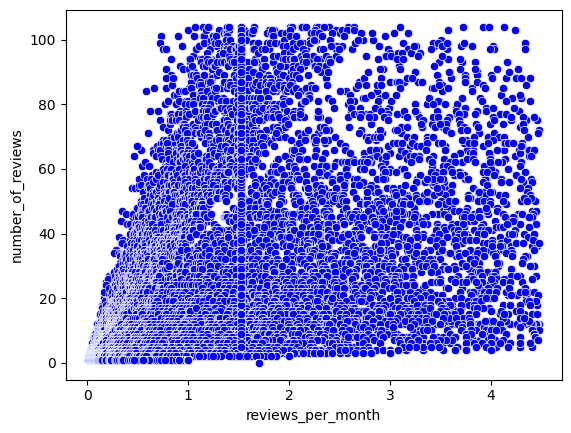

In [575]:
from turtle import color


sns.scatterplot(x='reviews_per_month', y='number_of_reviews', color="blue", data=df_entire_home_apt)

In [576]:
Vars_Indep= df_entire_home_apt[['reviews_per_month']]
Var_Dep= df_entire_home_apt['number_of_reviews']

In [577]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [578]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['reviews_per_month'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([5.0251125]),
 'rank_': 1,
 'singular_': array([130.95872885]),
 'intercept_': 14.303864180052734}

**modelo matemático y = 14.30 + 5.02x**

In [580]:
y_pred= model.predict(X=df_entire_home_apt[['reviews_per_month']])
y_pred

array([15.25863556, 17.01742493, 15.86164906, ..., 22.85879178,
       22.85879178, 22.85879178])

In [582]:
df_number_of_reviews_01 = df_entire_home_apt.copy()

In [583]:
#Insertamos la columna de predicciones en el DataFrame
df_number_of_reviews_01.insert(0, 'Predicciones', y_pred)
df_number_of_reviews_01

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
0,15.258636,Entire home/apt,100.000000,91.456246,1434.0,324,21,4.950000,4.950000,5.000000,0.190000
1,17.017425,Entire home/apt,94.538778,91.456246,830.0,346,61,4.880000,5.000000,4.950000,0.540000
2,15.861649,Entire home/apt,100.000000,90.000000,1469.0,87,39,4.710000,4.920000,4.910000,0.310000
3,22.858792,Entire home/apt,94.538778,91.456246,960.0,363,0,4.746342,4.815533,4.832627,1.702435
4,16.615416,Entire home/apt,100.000000,86.000000,960.0,357,64,4.700000,4.780000,4.980000,0.460000
...,...,...,...,...,...,...,...,...,...,...,...
24217,22.858792,Entire home/apt,100.000000,100.000000,980.0,342,0,4.746342,4.815533,4.832627,1.702435
24219,22.858792,Entire home/apt,100.000000,100.000000,760.0,352,0,4.746342,4.815533,4.832627,1.702435
24220,22.858792,Entire home/apt,94.538778,91.456246,1520.0,365,0,4.746342,4.815533,4.832627,1.702435
24222,22.858792,Entire home/apt,100.000000,100.000000,1200.0,344,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='reviews_per_month', ylabel='number_of_reviews'>

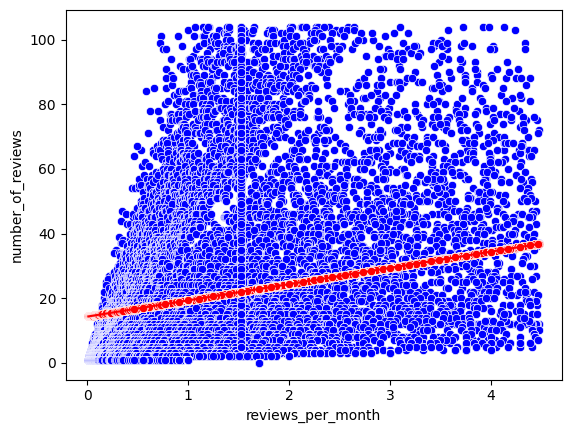

In [597]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='reviews_per_month',
                y='number_of_reviews',
                color="blue",
                data=df_number_of_reviews_01)
sns.scatterplot(x='reviews_per_month',
                y='Predicciones',
                color="red",
                data=df_number_of_reviews_01)
sns.lineplot(x='reviews_per_month',
             y='Predicciones',
             color="red",
             data=df_number_of_reviews_01)

In [585]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_number_of_reviews=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_number_of_reviews

0.04579280601353064

In [586]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_number_of_reviews=np.sqrt(coef_Deter_number_of_reviews)
coef_Correl_number_of_reviews

0.21399253728466944

##**Shared room**

###**number_of_reviews vs reviews_per_month**

<Axes: xlabel='reviews_per_month', ylabel='number_of_reviews'>

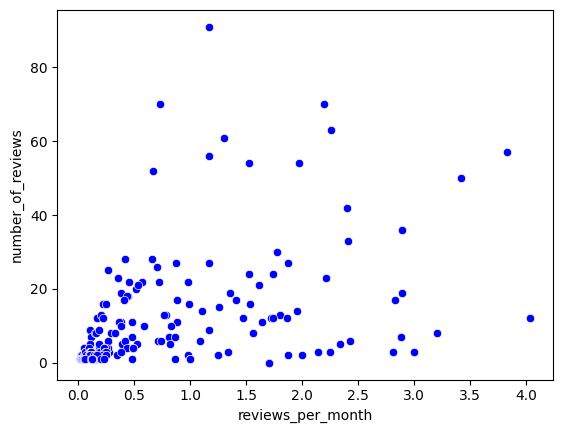

In [587]:
from turtle import color


sns.scatterplot(x='reviews_per_month', y='number_of_reviews', color="blue", data=df_shared_room)

In [588]:
Vars_Indep= df_shared_room[['reviews_per_month']]
Var_Dep= df_shared_room['number_of_reviews']

In [589]:
from sklearn.linear_model import LinearRegression
model= LinearRegression()
model.fit(X=Vars_Indep, y=Var_Dep)

LinearRegression()

In [590]:
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['reviews_per_month'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([2.23409216]),
 'rank_': 1,
 'singular_': array([14.29703307]),
 'intercept_': 4.822705637438986}

**modelo matemático y = 4.82 + 2.23x**

In [591]:
y_pred= model.predict(X=df_shared_room[['reviews_per_month']])
y_pred

array([ 8.62610242,  5.04611485,  6.45359292,  5.4035696 ,  8.10682111,
        8.62610242,  8.62610242,  4.84504656,  7.43659347,  8.62610242,
        4.86738748,  5.31420591,  5.2025013 ,  8.62610242,  8.62610242,
        8.62610242,  6.31954739,  4.93441025,  8.62610242,  6.40891107,
        8.62610242,  5.60463789,  5.38122868,  8.62610242,  4.86738748,
        8.62610242,  4.8897284 ,  8.66534416,  4.86738748,  5.76102435,
        4.86738748,  5.26952407,  4.86738748,  5.06845578,  8.62610242,
        8.62610242,  5.15781946,  4.86738748,  8.62610242,  5.04611485,
        8.62610242,  8.62610242,  8.62610242,  4.95675117,  5.31420591,
        5.82804711,  5.18016038,  4.93441025,  5.18016038,  5.02377393,
        5.18016038,  5.04611485,  4.95675117,  4.86738748,  5.67166066,
        5.69400158,  4.95675117,  9.849413  ,  8.62610242,  4.86738748,
        5.22484223,  7.43659347,  7.72702545,  4.86738748,  5.47059236,
        5.42591052,  6.29720646,  8.62610242,  5.02377393,  8.62

In [592]:
df_number_of_reviews_02 = df_shared_room.copy()

In [593]:
#Insertamos la columna de predicciones en el DataFrame
df_number_of_reviews_02.insert(0, 'Predicciones', y_pred)
df_number_of_reviews_02

,Predicciones,room_type,host_response_rate,host_acceptance_rate,price,availability_365,number_of_reviews,review_scores_cleanliness,review_scores_communication,review_scores_location,reviews_per_month
174,8.626102,Shared room,94.538778,99.000000,1815.0,365,0,4.746342,4.815533,4.832627,1.702435
437,5.046115,Shared room,100.000000,86.000000,182.0,346,9,4.670000,5.000000,4.780000,0.100000
443,6.453593,Shared room,90.000000,100.000000,450.0,302,70,4.930000,4.910000,4.680000,0.730000
472,5.403570,Shared room,100.000000,96.000000,272.0,354,25,4.480000,4.720000,4.800000,0.260000
499,8.106821,Shared room,100.000000,100.000000,320.0,351,12,4.620000,4.900000,4.900000,1.470000
...,...,...,...,...,...,...,...,...,...,...,...
23733,8.626102,Shared room,100.000000,100.000000,250.0,365,0,4.746342,4.815533,4.832627,1.702435
23762,8.626102,Shared room,100.000000,100.000000,224.0,364,0,4.746342,4.815533,4.832627,1.702435
23894,8.626102,Shared room,94.538778,91.456246,720.0,364,0,4.746342,4.815533,4.832627,1.702435
23898,8.626102,Shared room,100.000000,91.456246,176.0,364,0,4.746342,4.815533,4.832627,1.702435


<Axes: xlabel='reviews_per_month', ylabel='number_of_reviews'>

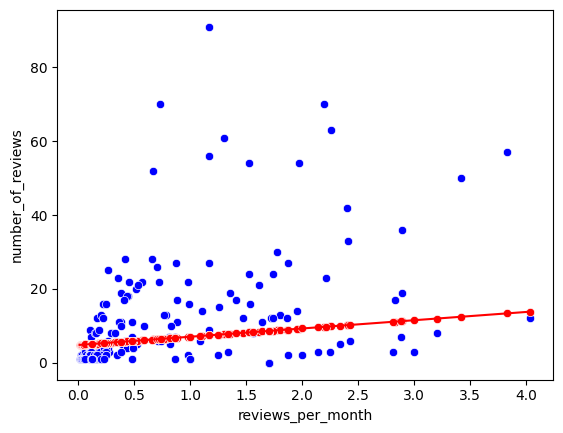

In [594]:
#Visualizamos la gráfica comparativa entre el total real y el total predecido

sns.scatterplot(x='reviews_per_month',
                y='number_of_reviews',
                color="blue",
                data=df_number_of_reviews_02)
sns.scatterplot(x='reviews_per_month',
                y='Predicciones',
                color="red",
                data=df_number_of_reviews_02)
sns.lineplot(x='reviews_per_month',
             y='Predicciones',
             color="red",
             data=df_number_of_reviews_02)

In [595]:
#Corroboramos cual es el coeficiente de Determinación de nuestro modelo
coef_Deter_number_of_reviews_02=model.score(X=Vars_Indep, y=Var_Dep)
coef_Deter_number_of_reviews_02

0.019504218850351585

In [596]:
#Corroboramos cual es el coeficiente de Correlación de nuestro modelo
coef_Correl_number_of_reviews_02=np.sqrt(coef_Deter_number_of_reviews_02)
coef_Correl_number_of_reviews_02

0.1396575055281727

#**Tabla con valores de correlación y determinación**

Estos valores no toman en cuenta el punto anterior, son relativos a la totalidad de los intentos hechos con los pares de variables dados en la tarea

In [571]:
valores = {0: {0: coef_Deter_01_01,
             1: coef_Deter_01_02,
             2: coef_Deter_01_03,
             3: coef_Deter_01_04,
             4: coef_Deter_01_05,
             5: coef_Deter_01_06},
           1: {0: coef_Correl_01_01,
             1: coef_Correl_01_02,
             2: coef_Correl_01_03,
             3: coef_Correl_01_04,
             4: coef_Correl_01_05,
             5: coef_Correl_01_06},
           2: {0: coef_Deter_02_01,
             1: coef_Deter_02_02,
             2: coef_Deter_02_03,
             3: coef_Deter_02_04,
             4: coef_Deter_02_05,
             5: coef_Deter_02_06},
           3: {0: coef_Correl_02_01,
             1: coef_Correl_02_02,
             2: coef_Correl_02_03,
             3: coef_Correl_02_04,
             4: coef_Correl_02_05,
             5: coef_Correl_02_06}}

tabla = pd.DataFrame(valores)

In [574]:
tabla = tabla.rename(columns = {0: 'Coef_Deter_EntireHome',
                        1: 'Coef_Corr_EntireHome',
                        2: 'Coef_Deter_EntireHome',
                        3: 'Coef_Corrr_EntireHome'})
tabla

,Coef_Deter_EntireHome,Coef_Corr_EntireHome,Coef_Deter_EntireHome,Coef_Corrr_EntireHome
0,0.048550,0.220340,0.044347,0.210588
1,0.003499,0.059152,0.002308,0.048037
2,0.074570,0.273076,0.075031,0.273918
3,0.001333,0.036505,0.000069,0.008336
4,0.005720,0.075630,0.002717,0.052128
5,0.014647,0.121027,0.118153,0.343734
